Creating a Python script to merge and display TIFF images from a 96-well plate in a layout that mimics their physical arrangement! 
could change to any other plates and rename the file and keep the high resolution

In [1]:
from PIL import Image, ImageOps
import matplotlib.pyplot as plt
import os

In [2]:
def load_images(image_directory, grid_size=(8, 12)):
    # Create an empty grid with None, which represents no image available
    image_grid = [[None for _ in range(grid_size[1])] for _ in range(grid_size[0])]
    
    # Expected well identifiers based on rows A to H and columns 1 to 12
    expected_wells = [f"{chr(row)}{col}" for row in range(ord('A'), ord('H') + 1) for col in range(1, 13)]
    found_wells = set()

    # Load each image into the grid
    for filename in os.listdir(image_directory):
        if 'GFP' in filename:
            # Extract the well identifier from the filename
            # Assuming the well identifier ends before the first underscore "_"
            identifier = filename.split('_')[0]  # The part before the first underscore is the well identifier
            
            # Check if the identifier is properly formatted
            if len(identifier) > 1 and identifier[0].isalpha() and identifier[1:].isdigit():
                row = ord(identifier[0].upper()) - ord('A')  # Convert 'A' to 'H' into 0 to 7
                col = int(identifier[1:]) - 1  # Convert '1' to '12' into 0 to 11
                
                if 0 <= row < grid_size[0] and 0 <= col < grid_size[1]:
                    img_path = os.path.join(image_directory, filename)
                    if os.path.exists(img_path):
                        img = Image.open(img_path)
                        image_grid[row][col] = img
                        found_wells.add(identifier.upper())

    # Check for any missing wells
    missing_wells = set(expected_wells) - found_wells
    print(f"Missing images for wells: {sorted(missing_wells)}")  # Optional: print out missing wells

    return image_grid



In [3]:
def create_master_figure(image_grid, image_size=(600, 600), cutoff=0, invert_colors=True):
    # Determine the master image size
    grid_rows, grid_cols = len(image_grid), len(image_grid[0])
    master_width = grid_cols * image_size[0]
    master_height = grid_rows * image_size[1]

    # Create an empty master image with a white background
    master_image = Image.new('RGB', (master_width, master_height), "white")

    # Paste each image with contrast enhancement and optional color inversion
    for i, row in enumerate(image_grid):
        for j, img in enumerate(row):
            if img is not None:
                # Convert the image to a compatible mode if necessary
                if img.mode == 'I;16':
                    img = img.convert('I')  # Convert 16-bit to 32-bit
                    img = img.point(lambda i: i * (1./256)).convert('L')  # Scale to 8-bit grayscale

                # Resize image
                img_resized = img.resize(image_size, Image.LANCZOS)

                # Enhance contrast (now that image is in a compatible mode)
                img_enhanced = ImageOps.autocontrast(img_resized, cutoff=6)

                # Invert colors if requested
                if invert_colors:
                    img_enhanced = ImageOps.invert(img_enhanced)

                # Paste the processed image
                master_image.paste(img_enhanced, (j * image_size[0], i * image_size[1]))

    return master_image


In [19]:
def display_figure_with_annotations(master_image, custom_x_labels, custom_y_labels, save_path=None, dpi=300):
    # Adjust figure size relative to desired DPI and image size
    inches_per_pt = 1.0 / dpi  # Convert pixels to inches for figure size
    fig_width = master_image.width * inches_per_pt  # width in inches
    fig_height = master_image.height * inches_per_pt  # height in inches

    fig, ax = plt.subplots(figsize=(fig_width, fig_height), dpi=dpi)
    ax.imshow(master_image)

    # Calculate positions for the ticks to be centered under each image
    x_ticks = [(i * master_image.width / len(custom_x_labels)) + ((master_image.width / len(custom_x_labels)) / 2) for i in range(len(custom_x_labels))]
    y_ticks = [(i * master_image.height / len(custom_y_labels)) + ((master_image.height / len(custom_y_labels)) / 2) for i in range(len(custom_y_labels))]

    ax.set_xticks(x_ticks)
    ax.set_yticks(y_ticks)
    ax.set_xticklabels(custom_x_labels, fontsize=20)  # Adjust fontsize as needed
    ax.set_yticklabels(custom_y_labels, fontsize=20)  # Adjust fontsize as needed

    # Rotate x labels if they overlap
    plt.setp(ax.get_xticklabels(), rotation=45, ha="right", rotation_mode="anchor")

    # Remove grid lines and hide axes spines
    ax.grid(False)
    for spine in ax.spines.values():
        spine.set_visible(False)

    # Use tight layout to maximize image space
    plt.tight_layout()

    # Save or show the figure
    if save_path:
        plt.savefig(save_path, dpi=dpi, bbox_inches='tight')
    else:
        plt.show()

Missing images for wells: ['H1', 'H10', 'H11', 'H12', 'H2', 'H3', 'H4', 'H5', 'H6', 'H7', 'H8', 'H9']


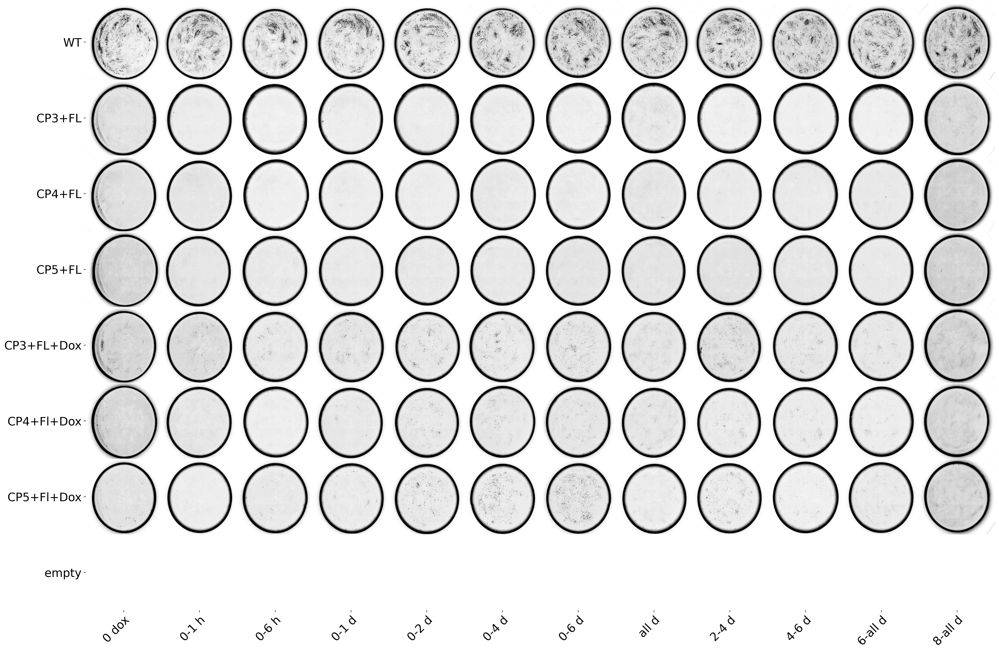

In [20]:
custom_x_labels = ['0 dox', '0-1 h', '0-6 h', '0-1 d', '0-2 d', '0-4 d', '0-6 d', 'all d', '2-4 d', '4-6 d', '6-all d', '8-all d']
custom_y_labels = ['WT', 'CP3+FL', 'CP4+FL', 'CP5+FL', 'CP3+FL+Dox', 'CP4+Fl+Dox', 'CP5+Fl+Dox', 'empty']
image_directory = '/Users/wangnongyun/Movies/DATA/#2340557408_Stitched'
image_grid = load_images(image_directory)
master_image = create_master_figure(image_grid, image_size=(600, 600))  # Adjust image_size as needed

# Save the figure with annotations
save_path = "/Users/wangnongyun/Desktop/CEBPB/Adobe illustrator/Image output/test5"
display_figure_with_annotations(master_image, custom_x_labels, custom_y_labels, save_path, dpi=300)